<div class="alert alert-block alert-warning">
    
# Predicting the quality of White Wine
       
    

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

from sklearn.model_selection import train_test_split

from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import cross_val_score
from sklearn import metrics

from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC

from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler

from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

from imblearn.over_sampling import SMOTE

import plotly.graph_objects as go

In [2]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
 }

<IPython.core.display.Javascript object>

In [3]:
%%javascript
IPython.OutputArea.auto_scroll_threshold = 9999;

<IPython.core.display.Javascript object>

In [4]:
df = pd.read_csv('winequality-white.csv', sep = ';')

<div class="alert alert-block alert-success">

## Input variables (based on physicochemical tests):
* fixed acidity
* volatile acidity
* citric acid
* residual sugar
* chlorides
* free sulfur dioxide
* total sulfur dioxide
* density
* pH
* sulphates
* alcohol

Output variable (based on sensory data): 
* quality (score between 0 and 10)
 
 </div>


## Exploratory Data Analysis

In [5]:
df.shape

(4898, 12)

In [6]:
df['quality'].value_counts()

6    2198
5    1457
7     880
8     175
4     163
3      20
9       5
Name: quality, dtype: int64

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4898 entries, 0 to 4897
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         4898 non-null   float64
 1   volatile acidity      4898 non-null   float64
 2   citric acid           4898 non-null   float64
 3   residual sugar        4898 non-null   float64
 4   chlorides             4898 non-null   float64
 5   free sulfur dioxide   4898 non-null   float64
 6   total sulfur dioxide  4898 non-null   float64
 7   density               4898 non-null   float64
 8   pH                    4898 non-null   float64
 9   sulphates             4898 non-null   float64
 10  alcohol               4898 non-null   float64
 11  quality               4898 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 459.3 KB


In [8]:
df.isna().sum()

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

In [9]:
df.duplicated().sum()

937

In [10]:
df=df.drop_duplicates()

In [11]:
df.shape

(3961, 12)

In [12]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
fixed acidity,3961.0,6.839346,0.866860,3.80000,6.30000,6.8000,7.30000,14.20000
volatile acidity,3961.0,0.280538,0.103437,0.08000,0.21000,0.2600,0.33000,1.10000
citric acid,3961.0,0.334332,0.122446,0.00000,0.27000,0.3200,0.39000,1.66000
residual sugar,3961.0,5.914819,4.861646,0.60000,1.60000,4.7000,8.90000,65.80000
chlorides,3961.0,0.045905,0.023103,0.00900,0.03500,0.0420,0.05000,0.34600
free sulfur dioxide,3961.0,34.889169,17.210021,2.00000,23.00000,33.0000,45.00000,289.00000
total sulfur dioxide,3961.0,137.193512,43.129065,9.00000,106.00000,133.0000,166.00000,440.00000
density,3961.0,0.993790,0.002905,0.98711,0.99162,0.9935,0.99571,1.03898
pH,3961.0,3.195458,0.151546,2.72000,3.09000,3.1800,3.29000,3.82000
sulphates,3961.0,0.490351,0.113523,0.22000,0.41000,0.4800,0.55000,1.08000


In [87]:
df.groupby('quality').describe().T

quality                      3           4            5            6  \
fixed acidity count  20.000000  153.000000  1175.000000  1788.000000   
              mean    7.600000    7.139869     6.921745     6.819435   
              std     1.724743    1.101574     0.862071     0.853331   
              min     4.200000    4.800000     4.500000     3.800000   
              25%     6.575000    6.400000     6.400000     6.300000   
...                        ...         ...          ...          ...   
alcohol       min     8.000000    8.400000     8.000000     8.500000   
              25%     9.550000    9.400000     9.200000     9.700000   
              50%    10.450000   10.100000     9.600000    10.500000   
              75%    11.000000   10.800000    10.400000    11.400000   
              max    12.600000   13.500000    13.600000    14.000000   

quality                       7           8          9  
fixed acidity count  689.000000  131.000000   5.000000  
              mean     6.701089    6.609924   7.420000  
              std      0.775123    0.822646   0.983362  
              min      4.200000    3.900000   6.600000  
              25%      6.200000    6.200000   6.900000  
...                         ...         ...        ...  
alcohol       min      8.600000    8.500000  10.400000  
              25%     10.700000   11.200000  12.400000  
              50%     11.500000   12.200000  12.500000  
              75%     12.400000   12.600000  12.700000  
              max     14.200000   14.000000  12.900000  

[88 rows x 7 columns]

### Very few wines are ranked quality 3 or quality 9, this can also give sampling issue later as there are too few examples.

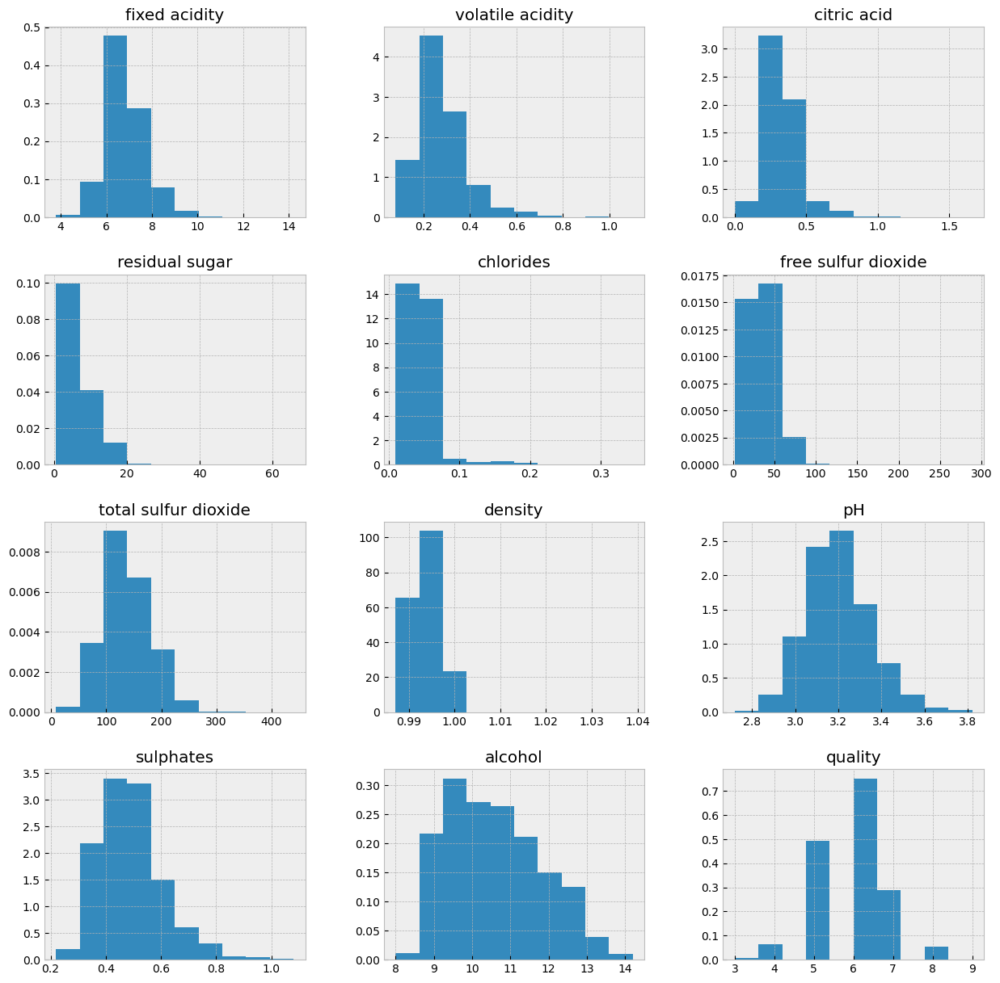

In [14]:
#lets visualise our data
#lets start with a pie chart of our target variable ; wine quality, 
#this is interactive, so you can hover your mouse for pop-up data

plt.style.use('bmh')#('pastel') 
df.hist(figsize = (15, 15), density = True, grid=True);
fig = go.Figure(data=[go.Pie(labels=df['quality'].value_counts().index, values=df['quality'].value_counts(), hole=.3)])
fig.update_layout(legend_title_text='Quality')
fig.show()

## Bivariate Analysis

<AxesSubplot:>

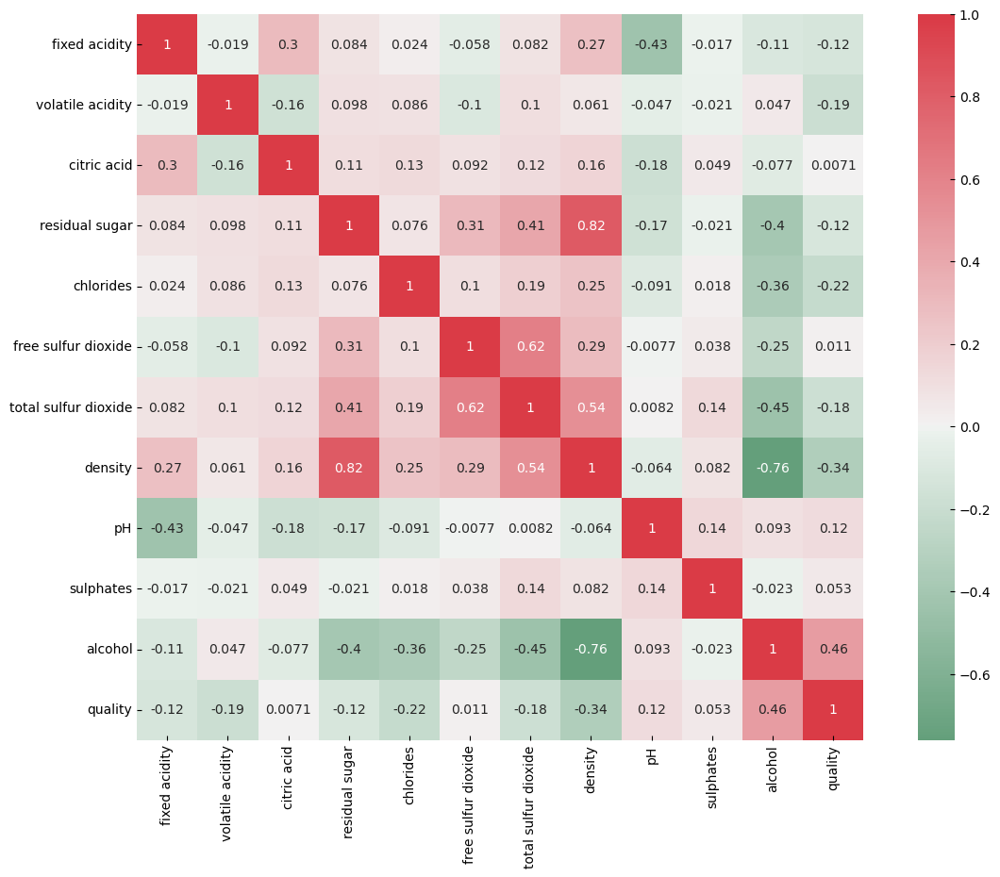

In [15]:
# checking corrleation between features

cmap= sns.diverging_palette(500,10, as_cmap=True)
#cmap=sns.cubehelix_palette(as_cmap=True)
#cmap=sns.color_palette("magma", as_cmap=True)

plt.figure(figsize = (15,10))
sns.heatmap(df.corr(), cmap=cmap, center= 0, square = True, annot = True)

In [16]:
#we can also look at the Pearson correlation by way of a table

ps = df.corr(method='pearson', min_periods=1).round(2).sort_values('quality', ascending = False)


### Higher alcohol content clearly has the highest correlation with wine quality

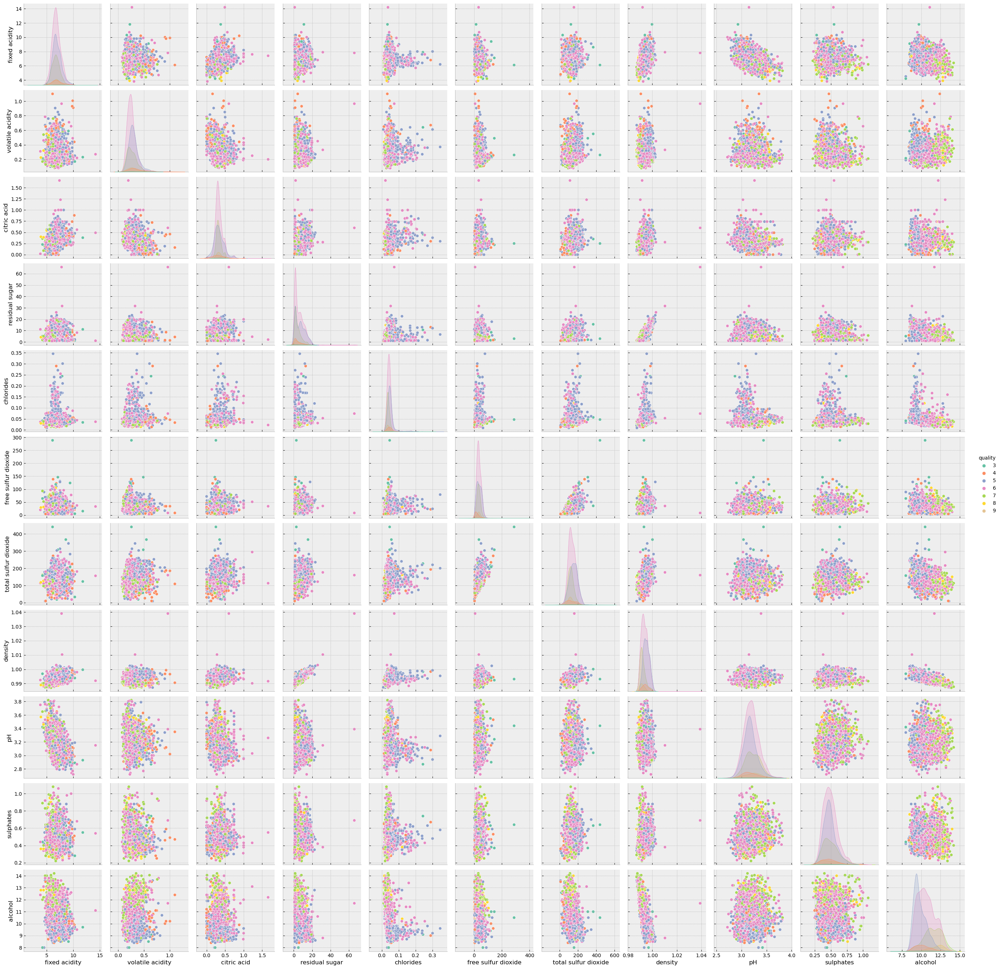

In [17]:
# lets look at the pairplots

sns.pairplot(df, hue="quality", palette="Set2", diag_kind="kde", height=2.5)

## Pairplot show outliers which could intefere with modelling

In [18]:
#removing outliers to clean up our data

def outliers(data, ft):
    Q1 = data[ft].quantile (0.10)
    Q3 = data[ft].quantile (0.90)
    IQR = Q3-Q1
    lower_bound = Q1-1.5*IQR
    upper_bound = Q3+1.5*IQR
    
    ls = data.index[(data[ft] < lower_bound) | (data[ft]> upper_bound)]
    return ls

In [19]:
df.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality'],
      dtype='object')

In [20]:
#create a list of outliers

index_list = []
features = ['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol']
for feature in features:
    index_list.extend(outliers(df, feature))

In [21]:
# dropping outliers

def remove(data, ls):
    ls = sorted(set(ls))
    data = data.drop(ls)
    return data

In [22]:
#create a clean datframe with outliers removed

df_clean = remove(df, index_list)

In [23]:
df_clean.shape

(3830, 12)

## Reviewing the data variables with the highest correlation with wine quality

In [24]:
# apart form alcohol and pH, the other more closely correlated attributes are inversley correlated, meaning the lower the level, 
# the better the wine!

df2=df_clean[['quality','alcohol','chlorides', 'density', 'total sulfur dioxide', 'residual sugar', 'pH']]

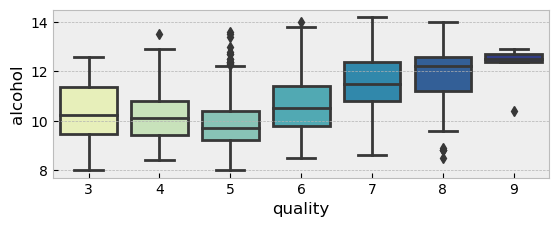

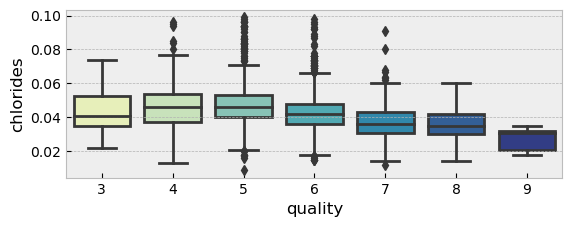

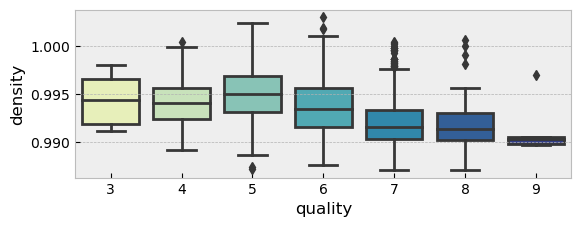

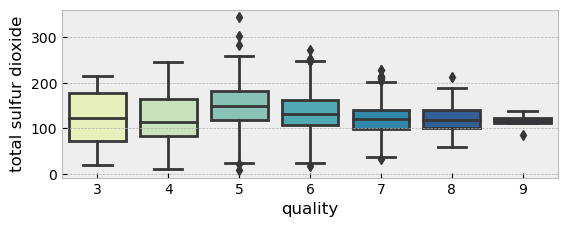

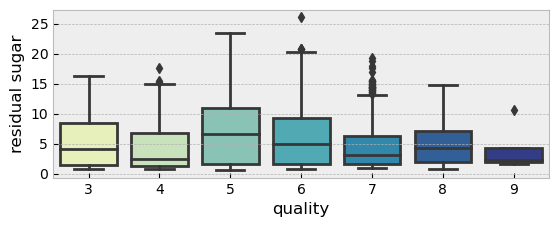

In [25]:
#viewing box plots of the main features of our datset

cols = df2[['alcohol','chlorides', 'density','total sulfur dioxide', 'residual sugar']]
count = 1
for col in cols:
    plt.subplot(2, 1, count)
    sns.boxplot(x = 'quality', y = col, data = df2, palette = 'YlGnBu')
    plt.show()
    count =+1
#plt.show()

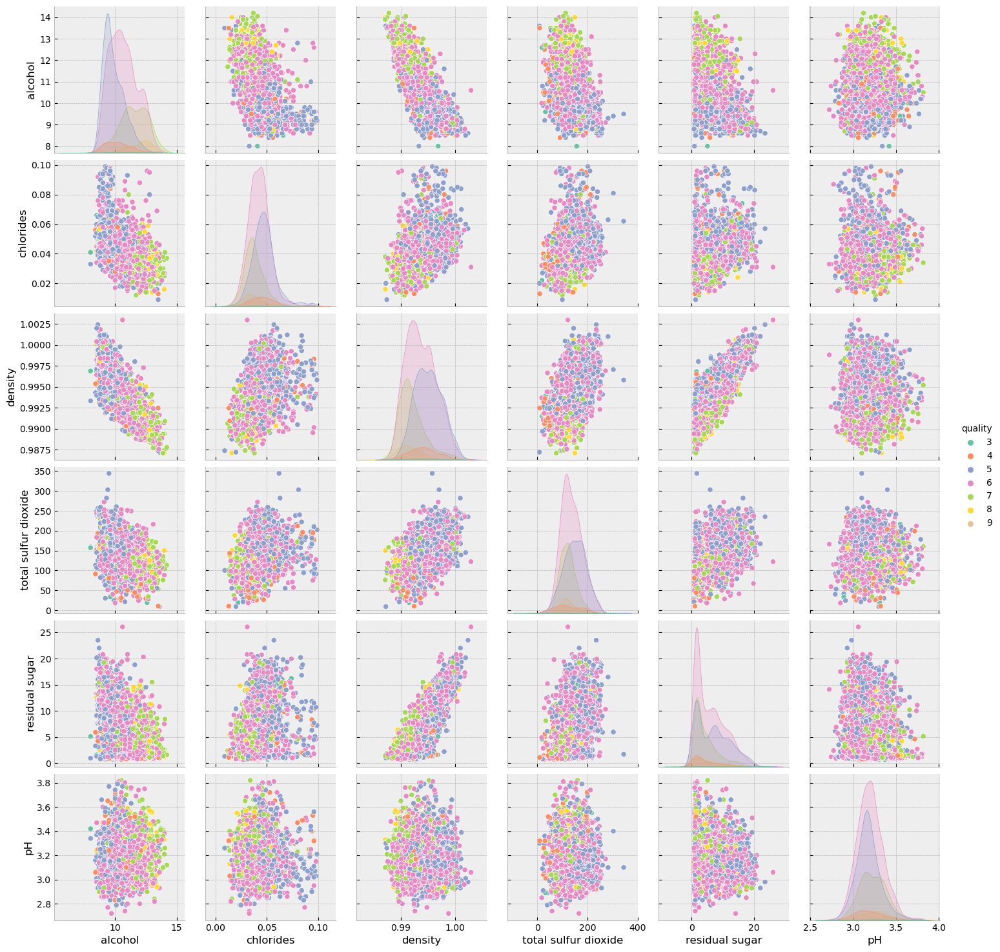

In [26]:
# viewing the main features as pairplots, noting where the better quality wines are concentrated on the plots
#higher on alcohol and pH, but lower on the other features

sns.pairplot(df2, hue="quality", palette="Set2", diag_kind="kde", height=2.5)

 # Preparing the data for processing

In [27]:
# features = ['alcohol','chlorides', 'density', 'total sulfur dioxide', 'residual sugar']
# quality = ['quality']

# x= df2[features]
# y= df2[quality]

In [28]:
# # creating our x and y parameters from the clean data, using all features
# we will use the full data set
x=df_clean.drop('quality', axis = 1)
# x.head()

y = df_clean['quality']
# y.head()

In [29]:
y.value_counts()

6    1736
5    1118
7     685
4     142
8     130
3      14
9       5
Name: quality, dtype: int64

## Oversampling the data using Synthetic Minority Oversampling Technique ('SMOTE')

In [30]:
# there is an imbalance in the number of quality categories (i.e. very few wines ranked 3 or 9)
# this can be addressed by over-sampling
# oversampling is prone to overfitting

oversample = SMOTE(k_neighbors=1) # k-neigbors=1 is forcing oversample as too few quality 9 wines
x, y = oversample.fit_resample(x, y)

# from imblearn.over_sampling import BorderlineSMOTE
# bsmote = BorderlineSMOTE(random_state = 101, kind = 'borderline-2')
# x, y = bsmote.fit_resample(x, y)


# this will increase our data population

In [31]:
x.shape

(12152, 11)

In [32]:
y.value_counts()

6    1736
5    1736
7    1736
8    1736
4    1736
3    1736
9    1736
Name: quality, dtype: int64

## Splitting the data into test and train datasets

In [33]:
#splitting the data into train and test samples



In [34]:
#y_train.value_counts(normalize = True)

In [35]:
#y_test.value_counts(normalize = True)

In [36]:
print(x_train.shape)
print(y_train.shape)

print(y_test.shape)
print(x_test.shape)

(9114, 11)
(9114,)
(3038,)
(3038, 11)


## Scaling the data

In [37]:
# # scaler = StandardScaler()

# # train data 
# x_train_scaled = scaler.fit_transform(x_train)

# # test data 
# x_test_scaled = scaler.transform(x_test)

In [38]:
# scaling our data using min-max

# call scaler
mm_scaler = MinMaxScaler()

# train data 
x_train_scaled = mm_scaler.fit_transform(x_train)

# test data 
x_test_scaled = mm_scaler.transform(x_test)


In [39]:
x_train_scaled = pd.DataFrame(x_train_scaled, columns = x_train.columns)

In [40]:
x_test_scaled = pd.DataFrame(x_test_scaled, columns = x_test.columns)

In [41]:
# reviewing the scaled data

x_train_scaled.describe().round(2)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
count,9114.00,9114.00,9114.00,9114.00,9114.00,9114.00,9114.00,9114.00,9114.00,9114.00,9114.00
mean,0.46,0.32,0.39,0.21,0.35,0.25,0.35,0.40,0.46,0.32,0.48
std,0.13,0.14,0.12,0.18,0.12,0.15,0.13,0.17,0.13,0.13,0.20
min,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,0.38,0.24,0.32,0.05,0.26,0.15,0.28,0.27,0.37,0.23,0.31
50%,0.45,0.29,0.39,0.15,0.33,0.24,0.33,0.38,0.47,0.30,0.48
75%,0.54,0.38,0.47,0.31,0.42,0.33,0.44,0.53,0.55,0.38,0.65
max,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00


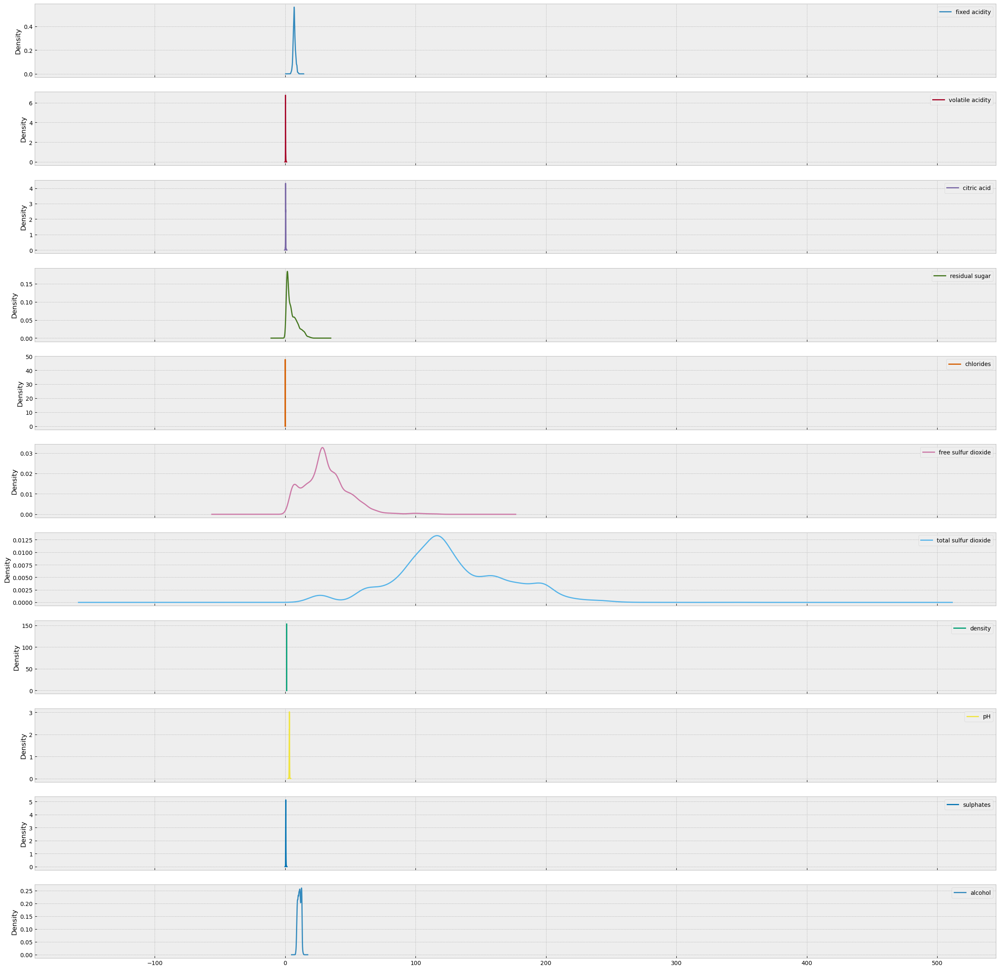

In [42]:
# viewing the unscaled data distribution

x_train.plot(kind = 'kde', subplots = True, figsize= (30,30));

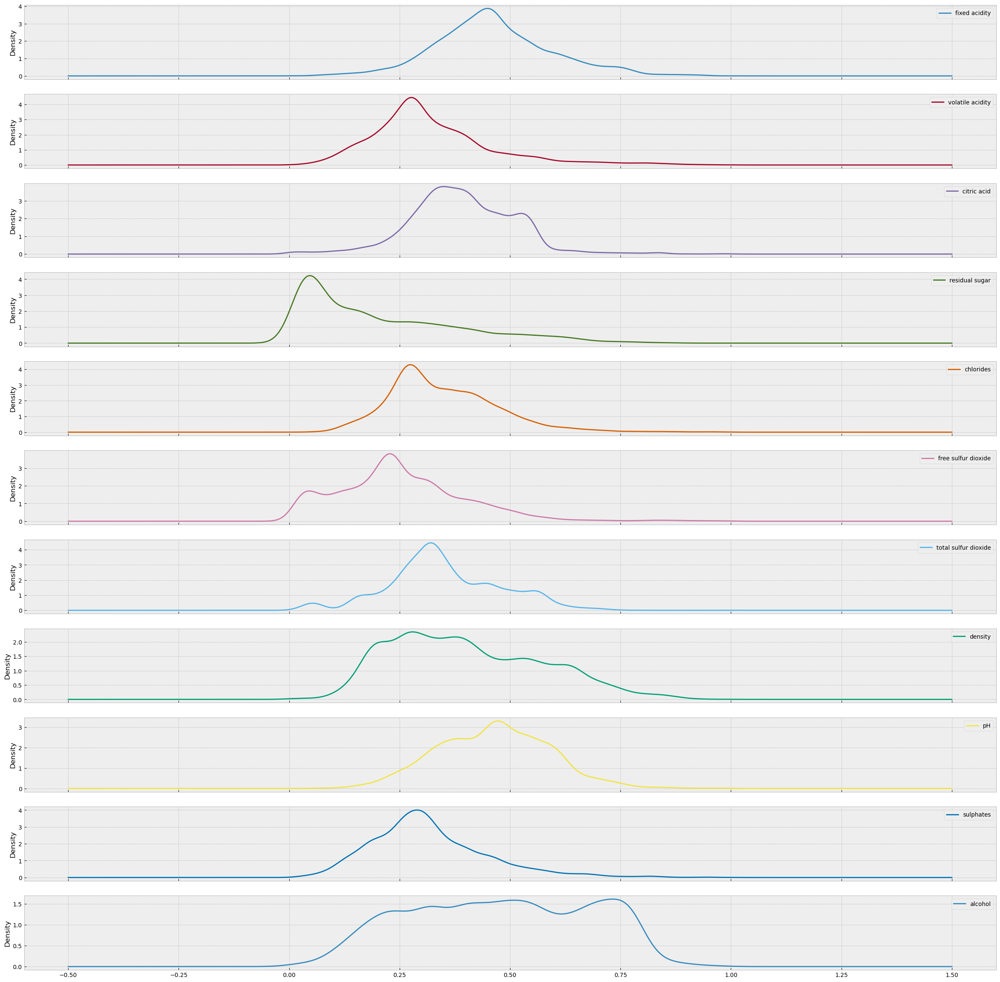

In [43]:
#viewing the scaled data

x_train_scaled.plot(kind = 'kde', subplots = True, figsize= (30,30));

 # Modelling the data to create wine quality predictions

## Linear Regression

In [44]:
linrgr = LinearRegression()
linrgr.fit(x_train_scaled, y_train)

LinearRegression()

In [45]:
linrgr.score(x_test_scaled, y_test).round(2)

0.5

In [46]:
# Let's now predict what our model will output for the test data input
y_pred = linrgr.predict(x_test_scaled)

# Here are the regression coefficients
print('Regression Coeffs:\n', linrgr.coef_)

# The coefficient of determination is the correlation coefficient squared
# This will give an indication of which features contributed most to explaining the variance in the output response
print('Coeff of Determination:\n', r2_score(y_test, y_pred))

# This will calculate the Mean Square Error between our model output and the 
# Here we compare our model output predictions to the actual data response output using the selected y test data
print('MSE: \n', mean_squared_error(y_test, y_pred))

Regression Coeffs:
 [  5.54875087  -1.25529479   0.61486876   6.55250207  -1.9056393
   2.48483853   1.55355354 -10.37816978   4.52427282   1.98374517
   0.36574228]
Coeff of Determination:
 0.49631297862723545
MSE: 
 1.9760429998587001


In [47]:
# from itertools import chain 

# feature_importance = linrgr.coef_
# feature_importance=list(chain.from_iterable(feature_importance))
# print(feature_importance)

In [48]:
# import matplotlib.pyplot as plt; plt.rcdefaults()
# import numpy as np

# features = ('alcohol','chlorides', 'density', 'volatile acidity', 'total sulfur dioxide')
# #features = ('s2', 's5', )
# #features = ('bmi', 'bp', 's4', 's5')
# y_pos = np.arange(len(features))

# plt.bar(y_pos, feature_importance, align='center', alpha=0.5)
# plt.xticks(y_pos, features)
# plt.ylabel('Regression Coefficient')
# plt.title('Feature Importance')
# plt.show()
# print(feature_importance)



## Decisions Trees

In [49]:

DTClass = DecisionTreeClassifier()
#DTClass_Gini = DecisionTreeClassifier(criterion = "gini", random_state = 100)
#DTClass_Entropy = DecisionTreeClassifier(criterion = "entropy", random_state = 100) 

DTClass.fit(x_train_scaled, y_train)
#DTClass_Gini.fit(x_train, y_train)
#DTClass.Entropy(x_train_scaled, y_train)


DecisionTreeClassifier()

In [50]:
# let's see how well our model does in predicting the classes on the input test data
y_pred = DTClass.predict(x_test_scaled)


In [51]:
# Now let's look at how important each input predictor or feature is in classifying the Iris classes

prediction_importance = list(DTClass.feature_importances_)
input_importance = [(feature, importance) for feature, importance in zip(features, prediction_importance)]
[print('For feature {} Relative Importance is {}'.format(*rows)) for rows in sorted(input_importance)];

For feature alcohol Relative Importance is 0.1010564444641625
For feature chlorides Relative Importance is 0.11140231966272322
For feature citric acid Relative Importance is 0.08976105310200792
For feature density Relative Importance is 0.07096248522020715
For feature fixed acidity Relative Importance is 0.06563001081147374
For feature free sulfur dioxide Relative Importance is 0.1626848146763669
For feature pH Relative Importance is 0.07943674625908184
For feature residual sugar Relative Importance is 0.09212338709464246
For feature sulphates Relative Importance is 0.06130883095315542
For feature total sulfur dioxide Relative Importance is 0.08752953068551741
For feature volatile acidity Relative Importance is 0.0781043770706614


In [52]:
# Now let's look at how well our model did using different metrics

from sklearn.metrics import classification_report, confusion_matrix
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[409   0   0   2   0   0   0]
 [  1 399  16  13   7   1   0]
 [  2  32 271  98  36   6   0]
 [  1  20 127 174 101  26   1]
 [  0   4  31  75 279  36   1]
 [  0   1   2  18  26 396   1]
 [  0   0   1   0   0   2 422]]
              precision    recall  f1-score   support

           3       0.99      1.00      0.99       411
           4       0.88      0.91      0.89       437
           5       0.60      0.61      0.61       445
           6       0.46      0.39      0.42       450
           7       0.62      0.65      0.64       426
           8       0.85      0.89      0.87       444
           9       0.99      0.99      0.99       425

    accuracy                           0.77      3038
   macro avg       0.77      0.78      0.77      3038
weighted avg       0.77      0.77      0.77      3038



## Random Forest

In [89]:
# Create the model with 100 trees
RFC = RandomForestClassifier(n_estimators=50, bootstrap = True, max_features = 'sqrt')

In [90]:
RFC.fit(x_train_scaled, y_train)

RandomForestClassifier(n_estimators=50)

In [91]:
y_pred_RFC = RFC.predict(x_test_scaled)

In [92]:

print(confusion_matrix(y_test, y_pred_RFC))
print(classification_report(y_test, y_pred_RFC))

# Now let's look at how well our model did using different metrics

[[411   0   0   0   0   0   0]
 [  0 426   8   2   1   0   0]
 [  1  17 331  79  15   2   0]
 [  1   6 122 222  94   5   0]
 [  0   3   8  53 348  13   1]
 [  0   0   0   4  14 426   0]
 [  0   0   0   1   0   1 423]]
              precision    recall  f1-score   support

           3       1.00      1.00      1.00       411
           4       0.94      0.97      0.96       437
           5       0.71      0.74      0.72       445
           6       0.61      0.49      0.55       450
           7       0.74      0.82      0.78       426
           8       0.95      0.96      0.96       444
           9       1.00      1.00      1.00       425

    accuracy                           0.85      3038
   macro avg       0.85      0.85      0.85      3038
weighted avg       0.85      0.85      0.85      3038



Random Forest Confusion Matrix


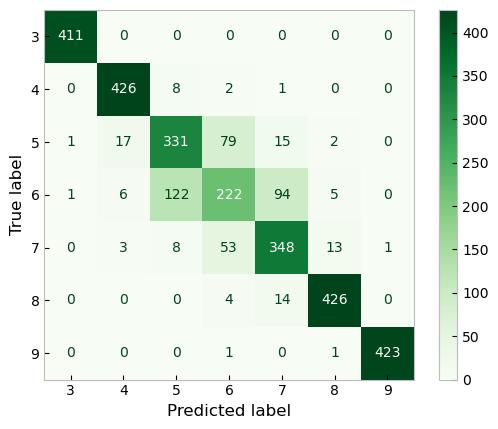

In [112]:
# lets visulaise the confusion matrix
cm = confusion_matrix(y_test, y_pred_RFC, labels=RFC.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=RFC.classes_, )

disp = disp.plot(include_values=True, cmap='Greens', ax=None, xticks_rotation='horizontal')
plt.grid(False)
print('Random Forest Confusion Matrix')
plt.show()

In [58]:
prediction_importance = list(RFC.feature_importances_)
input_importance = [(feature, importance) for feature, importance in zip(features, prediction_importance)]
[print('For feature {} Relative Importance is {}'.format(*rows)) for rows in sorted(input_importance)];

For feature alcohol Relative Importance is 0.10282153216428426
For feature chlorides Relative Importance is 0.09862201044400246
For feature citric acid Relative Importance is 0.0882347910861697
For feature density Relative Importance is 0.0800051118404059
For feature fixed acidity Relative Importance is 0.08193255221682352
For feature free sulfur dioxide Relative Importance is 0.12584043688389424
For feature pH Relative Importance is 0.08790306237002171
For feature residual sugar Relative Importance is 0.07480646365457841
For feature sulphates Relative Importance is 0.07171358500033727
For feature total sulfur dioxide Relative Importance is 0.10369307196153767
For feature volatile acidity Relative Importance is 0.08442738237794495


In [59]:
#class_names = df.columns
# plt.confusion_matrix(y_test, y_pred)
# plt.title('\t Confusion Matrix for Decision Tree Classifier \n')
# plt.show()

### SVM Model

In [60]:
# call the model 
svc = SVC() #Default hyperparameters

# fit the model 
svc.fit(x_train_scaled,y_train)

# score the model 
print("The accuracy of the SVC for train is {:.2%}".format(svc.score(x_train_scaled, y_train)))
print("The accuracy of the SVC for test is {:.2%}".format(svc.score(x_test_scaled, y_test)))

The accuracy of the SVC for train is 75.27%
The accuracy of the SVC for test is 71.40%


SVM Confusion Matrix


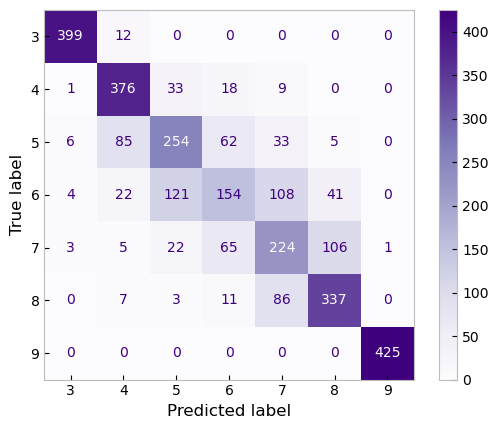

In [113]:
# lets visulaise the confusion matrix
y_pred_SVM = svc.predict(x_test_scaled)
cm = confusion_matrix(y_test, y_pred_SVM, labels=RFC.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=RFC.classes_, )

disp = disp.plot(include_values=True, cmap='Purples', ax=None, xticks_rotation='horizontal')
plt.grid(False)
print('SVM Confusion Matrix')
plt.show()

### KNN Model

In [94]:
KNN = KNeighborsClassifier(n_neighbors=10)
KNN.fit(x_train_scaled, y_train)

KNeighborsClassifier(n_neighbors=10)

In [95]:
y_pred_KNN = KNN.predict(x_test_scaled)
y_predall = KNN.predict(x) # this is just for plotting the entire data comparison later

In [96]:
#https://scikit-learn.org/stable/modules/generated/sklearn.metrics.classification_report.html
#from sklearn.metrics import classification_report, confusion_matrix
print(confusion_matrix(y_test, y_pred_KNN))
print(classification_report(y_test, y_pred_KNN))

[[411   0   0   0   0   0   0]
 [  0 428   4   2   3   0   0]
 [ 14  87 242  38  29  34   1]
 [  7  42 119 115 112  54   1]
 [  5  10  30  58 249  71   3]
 [  0   0   1   4   9 430   0]
 [  0   0   0   0   0   0 425]]
              precision    recall  f1-score   support

           3       0.94      1.00      0.97       411
           4       0.75      0.98      0.85       437
           5       0.61      0.54      0.58       445
           6       0.53      0.26      0.34       450
           7       0.62      0.58      0.60       426
           8       0.73      0.97      0.83       444
           9       0.99      1.00      0.99       425

    accuracy                           0.76      3038
   macro avg       0.74      0.76      0.74      3038
weighted avg       0.74      0.76      0.73      3038



KNN Confusion Matrix


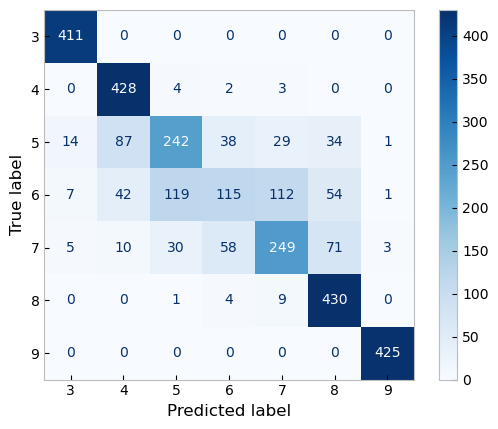

In [111]:
# lets visulaise the confusion matrix
cm = confusion_matrix(y_test, y_pred_KNN, labels=RFC.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=RFC.classes_, )

disp = disp.plot(include_values=True, cmap='Blues', ax=None, xticks_rotation='horizontal')
plt.grid(False)
print('KNN Confusion Matrix')
plt.show()

# Checking the model on unscaled data

## SVM on unscaled data

In [65]:
#as SVM gives the best result, trying this on unscaled data


In [66]:
# call the model 
svc_unscaled = SVC() #Default hyperparameters

# fit the model 
svc_unscaled.fit(x_train,y_train)

# score the model 
print("The accuracy of the SVC for train is {:.2%}".format(svc.score(x_train, y_train)))
print("The accuracy of the SVC for test is {:.2%}".format(svc.score(x_test, y_test)))

The accuracy of the SVC for train is 14.11%
The accuracy of the SVC for test is 14.81%


In [67]:
# unscaled data does not appear to inmprove the prediction

## Random Forest on unscaled data¶

In [68]:
# Create the model with 100 trees
RFC_unscaled = RandomForestClassifier(n_estimators=100, bootstrap = True, max_features = 'sqrt')

In [69]:
RFC_unscaled.fit(x_train, y_train)

RandomForestClassifier()

In [70]:
y_pred_unscaled = RFC.predict(x_test)

In [71]:
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred_unscaled))

[[411   0   0   0   0   0   0]
 [  0 428   4   2   3   0   0]
 [ 14  87 242  38  29  34   1]
 [  7  42 119 115 112  54   1]
 [  5  10  30  58 249  71   3]
 [  0   0   1   4   9 430   0]
 [  0   0   0   0   0   0 425]]
              precision    recall  f1-score   support

           3       0.00      0.00      0.00       411
           4       0.00      0.00      0.00       437
           5       0.00      0.00      0.00       445
           6       0.18      0.55      0.27       450
           7       0.13      0.49      0.21       426
           8       0.12      0.02      0.04       444
           9       0.00      0.00      0.00       425

    accuracy                           0.15      3038
   macro avg       0.06      0.15      0.07      3038
weighted avg       0.06      0.15      0.08      3038



## KNN on unscaled data

In [72]:
KNN_unscaled = KNeighborsClassifier(n_neighbors=5)
KNN_unscaled.fit(x_train, y_train)

KNeighborsClassifier()

In [73]:
y_pred_unscaled = KNN.predict(x_test)
#y_predall = KNN.predict(x) # this is just for plotting the entire data comparison later

In [74]:
print(confusion_matrix(y_test, y_pred_unscaled))
print(classification_report(y_test, y_pred_unscaled))

[[ 18   0 383  10   0   0   0]
 [  1   0 431   4   0   1   0]
 [  6   0 439   0   0   0   0]
 [ 10   0 440   0   0   0   0]
 [ 10   0 416   0   0   0   0]
 [ 16   0 428   0   0   0   0]
 [  7   0 418   0   0   0   0]]
              precision    recall  f1-score   support

           3       0.26      0.04      0.08       411
           4       0.00      0.00      0.00       437
           5       0.15      0.99      0.26       445
           6       0.00      0.00      0.00       450
           7       0.00      0.00      0.00       426
           8       0.00      0.00      0.00       444
           9       0.00      0.00      0.00       425

    accuracy                           0.15      3038
   macro avg       0.06      0.15      0.05      3038
weighted avg       0.06      0.15      0.05      3038



### Unscaled data delievers very poor results

# Checking the models without oversampling

In [75]:
# recreating test train split of the data before we oversampled

x1=df_clean.drop('quality', axis = 1)
#x.head()

y1 = df_clean['quality']
#y.head()

x1_train, x1_test, y1_train, y1_test = train_test_split(x1, y1, random_state=1)

In [76]:
# re-scaling our data using min-max

# call scaler
mm_scaler = MinMaxScaler()

# train data 
x1_train_scaled = mm_scaler.fit_transform(x1_train)

# test data 
x1_test_scaled = mm_scaler.transform(x1_test)


In [77]:
x1_train_scaled = pd.DataFrame(x1_train_scaled, columns = x1_train.columns)

In [78]:
x1_test_scaled = pd.DataFrame(x1_test_scaled, columns = x1_test.columns)

## KNN on data without oversampling

In [79]:
KNN = KNeighborsClassifier(n_neighbors=3)
KNN.fit(x1_train_scaled, y1_train)

KNeighborsClassifier(n_neighbors=3)

In [80]:
y1_pred_scaled = KNN.predict(x1_test_scaled)
#y_predall = KNN.predict(x) # this is just for plotting the entire data comparison later

In [81]:
print(confusion_matrix(y1_test, y1_pred_scaled))
print(classification_report(y1_test, y1_pred_scaled))

[[  0   0   1   2   1   0   0]
 [  0  12  14   9   3   0   0]
 [  3  16 156  97   7   1   0]
 [  1  16 145 220  60   2   0]
 [  0   1  18  72  59   2   0]
 [  0   0   1  17  18   3   0]
 [  0   0   0   1   0   0   0]]
              precision    recall  f1-score   support

           3       0.00      0.00      0.00         4
           4       0.27      0.32      0.29        38
           5       0.47      0.56      0.51       280
           6       0.53      0.50      0.51       444
           7       0.40      0.39      0.39       152
           8       0.38      0.08      0.13        39
           9       0.00      0.00      0.00         1

    accuracy                           0.47       958
   macro avg       0.29      0.26      0.26       958
weighted avg       0.47      0.47      0.46       958



## SVM without oversampling

In [82]:
svc1 = SVC() #Default hyperparameters

# fit the model 
svc1.fit(x1_train_scaled,y1_train)

# score the model 
print("The accuracy of the SVC for train is {:.2%}".format(svc.score(x1_train_scaled, y1_train)))
print("The accuracy of the SVC for test is {:.2%}".format(svc.score(x1_test_scaled, y1_test)))

The accuracy of the SVC for train is 49.55%
The accuracy of the SVC for test is 46.45%


## Random Forest without oversampling

In [83]:
# Create the model with 100 trees
RFC1 = RandomForestClassifier(n_estimators=100, bootstrap = True, max_features = 'sqrt')

In [84]:
RFC1.fit(x1_train, y1_train)

RandomForestClassifier()

In [85]:
y1_pred = RFC1.predict(x1_test)

In [86]:
print(confusion_matrix(y1_test, y1_pred))
print(classification_report(y1_test, y1_pred))

[[  0   0   1   3   0   0   0]
 [  0   3  21  13   1   0   0]
 [  0   1 155 122   2   0   0]
 [  0   1  84 324  34   1   0]
 [  0   0   6  97  48   1   0]
 [  0   0   1  21  16   1   0]
 [  0   0   0   1   0   0   0]]
              precision    recall  f1-score   support

           3       0.00      0.00      0.00         4
           4       0.60      0.08      0.14        38
           5       0.58      0.55      0.57       280
           6       0.56      0.73      0.63       444
           7       0.48      0.32      0.38       152
           8       0.33      0.03      0.05        39
           9       0.00      0.00      0.00         1

    accuracy                           0.55       958
   macro avg       0.36      0.24      0.25       958
weighted avg       0.54      0.55      0.53       958



## Without oversampling the models deliver poor results

# Conclusion; Random Forest on scaled data with oversampling gives the best overall wine quality prediction result. SVM and KNN also produce good results.